In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/twitter-hate-speech/test_tweets_anuFYb8.csv
/kaggle/input/twitter-hate-speech/train_E6oV3lV.csv


In [2]:
train_ds = pd.read_csv('../input/twitter-hate-speech/train_E6oV3lV.csv')
test_ds = pd.read_csv('../input/twitter-hate-speech/test_tweets_anuFYb8.csv')

In [3]:
train_ds.head()

,id,label,tweet
0,1,0,@user when a father is dysfunctional and is s...
1,2,0,@user @user thanks for #lyft credit i can't us...
2,3,0,bihday your majesty
3,4,0,#model i love u take with u all the time in ...
4,5,0,factsguide: society now #motivation


In [4]:
test_ds.head()

,id,tweet
0,31963,#studiolife #aislife #requires #passion #dedic...
1,31964,@user #white #supremacists want everyone to s...
2,31965,safe ways to heal your #acne!! #altwaystohe...
3,31966,is the hp and the cursed child book up for res...
4,31967,"3rd #bihday to my amazing, hilarious #nephew..."


In [5]:
import re
def tweet_cleaner(tweet) :
    tweet = re.sub("(@[A-Za-z0-9]+)|(#)|(RT[\s]+)|(https?:\/\/\S+)|([^a-zA-Z0-9 -])", "", tweet)
    return tweet

In [6]:
train_ds['tweet'] = train_ds['tweet'].apply(tweet_cleaner)
train_ds

,id,label,tweet
0,1,0,when a father is dysfunctional and is so sel...
1,2,0,thanks for lyft credit i cant use cause they...
2,3,0,bihday your majesty
3,4,0,model i love u take with u all the time in u...
4,5,0,factsguide society now motivation
...,...,...,...
31957,31958,0,ate isz that youuu
31958,31959,0,to see nina turner on the airwaves trying to...
31959,31960,0,listening to sad songs on a monday morning otw...
31960,31961,1,sikh temple vandalised in in calgary wso cond...


In [7]:
train_ds.head()

,id,label,tweet
0,1,0,when a father is dysfunctional and is so sel...
1,2,0,thanks for lyft credit i cant use cause they...
2,3,0,bihday your majesty
3,4,0,model i love u take with u all the time in u...
4,5,0,factsguide society now motivation


In [8]:
test_ds['tweet'] = test_ds['tweet'].apply(tweet_cleaner)
test_ds

,id,tweet
0,31963,studiolife aislife requires passion dedication...
1,31964,white supremacists want everyone to see the ...
2,31965,safe ways to heal your acne altwaystoheal h...
3,31966,is the hp and the cursed child book up for res...
4,31967,3rd bihday to my amazing hilarious nephew el...
...,...,...
17192,49155,thought factory left-right polarisation trump ...
17193,49156,feeling like a mermaid hairflip neverready fo...
17194,49157,hillary campaigned today in ohioomg amp used w...
17195,49158,happy at work conference right mindset leads t...


In [9]:
train_ds.drop('id',inplace = True, axis = 1)
train_ds

,label,tweet
0,0,when a father is dysfunctional and is so sel...
1,0,thanks for lyft credit i cant use cause they...
2,0,bihday your majesty
3,0,model i love u take with u all the time in u...
4,0,factsguide society now motivation
...,...,...
31957,0,ate isz that youuu
31958,0,to see nina turner on the airwaves trying to...
31959,0,listening to sad songs on a monday morning otw...
31960,1,sikh temple vandalised in in calgary wso cond...


In [10]:
test_ds.drop('id',inplace = True, axis = 1)
test_ds

,tweet
0,studiolife aislife requires passion dedication...
1,white supremacists want everyone to see the ...
2,safe ways to heal your acne altwaystoheal h...
3,is the hp and the cursed child book up for res...
4,3rd bihday to my amazing hilarious nephew el...
...,...
17192,thought factory left-right polarisation trump ...
17193,feeling like a mermaid hairflip neverready fo...
17194,hillary campaigned today in ohioomg amp used w...
17195,happy at work conference right mindset leads t...


In [11]:
from textblob import TextBlob
def getSubjectivity(tweet) :
    return TextBlob(tweet).sentiment.subjectivity
def getPolarity(tweet) :
    return TextBlob(tweet).sentiment.polarity
def getAnalysis(score) :
    return 'Neutral' if (score == 0) else ('Negative' if (score < 0) else 'Positive')

In [12]:
train_ds['Subjectivity'] = train_ds['tweet'].apply(getSubjectivity)
train_ds['Polarity'] = train_ds['tweet'].apply(getPolarity)
train_ds['Analysis'] = train_ds['Polarity'].apply(getAnalysis)

train_ds

,label,tweet,Subjectivity,Polarity,Analysis
0,0,when a father is dysfunctional and is so sel...,1.0,-0.5,Negative
1,0,thanks for lyft credit i cant use cause they...,0.2,0.2,Positive
2,0,bihday your majesty,0.0,0.0,Neutral
3,0,model i love u take with u all the time in u...,0.6,0.5,Positive
4,0,factsguide society now motivation,0.0,0.0,Neutral
...,...,...,...,...,...
31957,0,ate isz that youuu,0.0,0.0,Neutral
31958,0,to see nina turner on the airwaves trying to...,0.5,0.4,Positive
31959,0,listening to sad songs on a monday morning otw...,1.0,-0.5,Negative
31960,1,sikh temple vandalised in in calgary wso cond...,0.0,0.0,Neutral


In [13]:
from sklearn.model_selection import train_test_split

X_train, X_test, Y_train, Y_test = train_test_split(train_ds["tweet"], train_ds["label"], test_size = 0.20, random_state = 42)

In [14]:
from sklearn.feature_extraction.text import CountVectorizer, TfidfTransformer
count_vect = CountVectorizer(stop_words='english')
transformer = TfidfTransformer(sublinear_tf=True)

X_train_cnt = count_vect.fit_transform(X_train)
X_train_TF = transformer.fit_transform(X_train_cnt)
print(X_train_cnt.shape)
print(X_train_TF.shape)

X_test_cnt = count_vect.transform(X_test)
X_test_TF = transformer.transform(X_test_cnt)
print(X_test_cnt.shape)
print(X_test_TF.shape)

(25569, 35376)
(25569, 35376)
(6393, 35376)
(6393, 35376)


In [15]:
from sklearn.ensemble import RandomForestClassifier as RFClass
ranForModel = RFClass(n_estimators=10, criterion = "entropy")
ranForModel.fit(X_train_TF, Y_train)

RandomForestClassifier(criterion='entropy', n_estimators=10)

In [16]:
from sklearn.metrics import accuracy_score
from sklearn.metrics import f1_score
from sklearn.metrics import classification_report as class_re
from sklearn.metrics import confusion_matrix as c_m
ranForPredict = ranForModel.predict(X_test_TF)
print("Predicted Class:",ranForPredict)
print("Confusion Matrix:\n",c_m(Y_test ,ranForPredict))
print("Accuracy:", accuracy_score(Y_test ,ranForPredict))
print("F_score:", f1_score(Y_test ,ranForPredict))
print("Classification Report:\n",class_re(Y_test ,ranForPredict))

Predicted Class: [0 0 0 ... 0 0 1]
Confusion Matrix:
 [[5898   39]
 [ 231  225]]
Accuracy: 0.9577663068981699
F_score: 0.625
Classification Report:
               precision    recall  f1-score   support

           0       0.96      0.99      0.98      5937
           1       0.85      0.49      0.62       456

    accuracy                           0.96      6393
   macro avg       0.91      0.74      0.80      6393
weighted avg       0.95      0.96      0.95      6393



In [17]:
from wordcloud import WordCloud as WC
WordsInAllTweets = ''.join([words for words in train_ds['tweet']])
wordcloud = WC(width = 1000, height = 600, random_state = 42, max_font_size = 120).generate(WordsInAllTweets)


pos_train_ds = train_ds[train_ds['Analysis'] == "Positive"]
WordsInPosTweets = ''.join([words for words in pos_train_ds['tweet']])
pos_wordcloud = WC(width = 1000, height = 600, random_state = 42, max_font_size = 120).generate(WordsInPosTweets)

neg_train_ds = train_ds[train_ds['Analysis'] == "Negative"]
WordsInNegTweets = ''.join([words for words in neg_train_ds['tweet']])
neg_wordcloud = WC(width = 1000, height = 600, random_state = 42, max_font_size = 120).generate(WordsInNegTweets)

neu_train_ds = train_ds[train_ds['Analysis'] == "Neutral"]
WordsInNeuTweets = ''.join([words for words in neu_train_ds['tweet']])
neu_wordcloud = WC(width = 1000, height = 600, random_state = 42, max_font_size = 120).generate(WordsInNeuTweets)

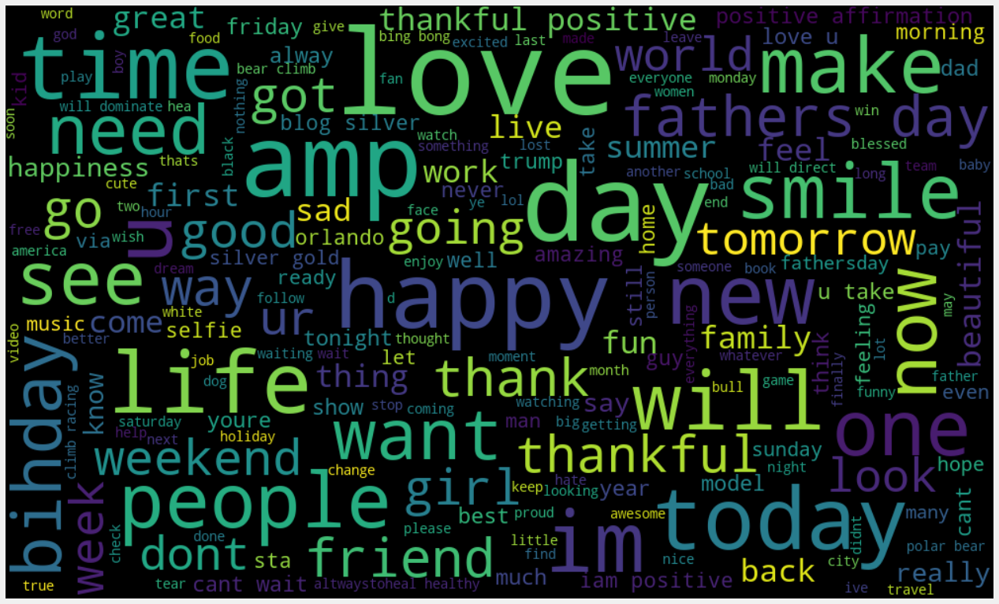

In [18]:
import matplotlib.pyplot as plt
plt.style.use('fivethirtyeight')
plt.figure(figsize = (20,28))
plt.imshow(wordcloud, interpolation = "bilinear")
plt.axis('off')
plt.show()

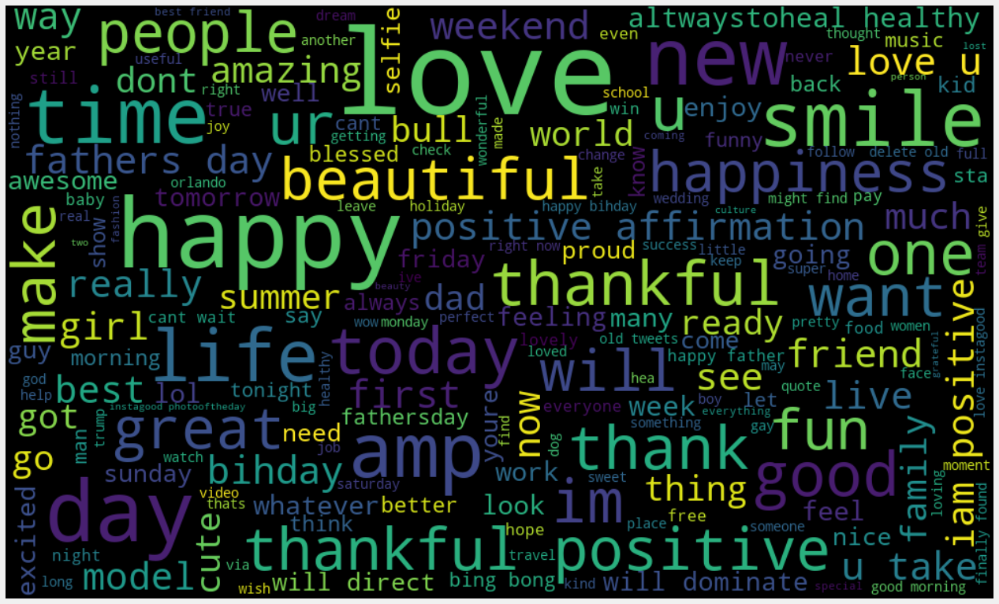

In [19]:
plt.figure(figsize = (20,28))
plt.imshow(pos_wordcloud, interpolation = "bilinear")
plt.axis('off')
plt.show()

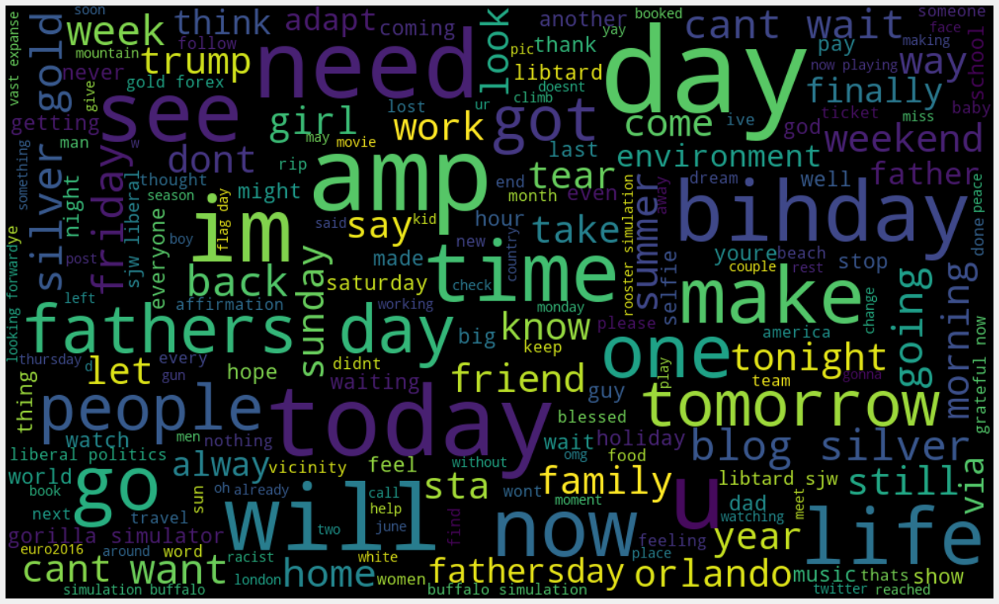

In [20]:
plt.figure(figsize = (20,28))
plt.imshow(neu_wordcloud, interpolation = "bilinear")
plt.axis('off')
plt.show()

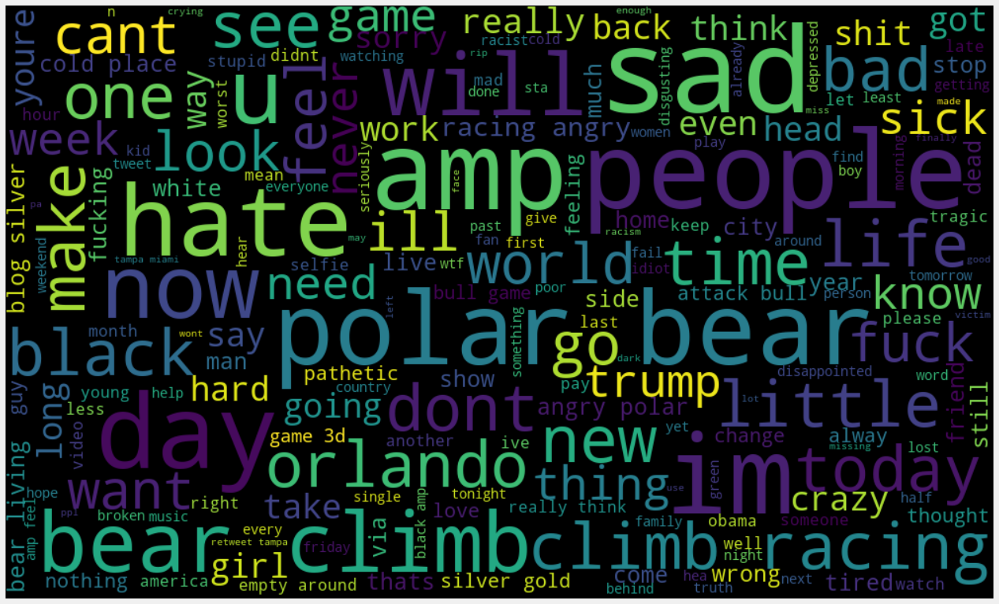

In [21]:
plt.figure(figsize = (20,28))
plt.imshow(neg_wordcloud, interpolation = "bilinear")
plt.axis('off')
plt.show()

In [22]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score as acc_score
from sklearn.metrics import classification_report as class_re
from sklearn.preprocessing import StandardScaler

train_ds.drop('tweet',inplace = True, axis = 1)
train_ds.Analysis = train_ds.Analysis.map({"Neutral":0, "Negative":-1, "Positive":+1})
col_names = ["Subjectivity", "Polarity", "Analysis"]
target_name = ["label"]


X = train_ds[col_names]
X_std_scal = StandardScaler().fit_transform(X)
Y = train_ds[target_name]

X_train, X_test, Y_train, Y_test = train_test_split(X_std_scal, Y, test_size = 0.20, random_state = 42)

DTreeClass = DecisionTreeClassifier(criterion = "entropy", random_state = 42, max_depth = 7)
DTreeClass.fit(X_train, Y_train)
Y_pred = DTreeClass.predict(X_test)
Y_scored = DTreeClass.score(X,Y)
Y_scored2 = DTreeClass.score(X_train,Y_train)
Y_scored3 = DTreeClass.score(X_test,Y_test)


print("Classification Report:\n",class_re(Y_test, Y_pred))
print("Confusion Matrix:\n",c_m(Y_test ,Y_pred))
print("F_score:", f1_score(Y_test ,Y_pred))
print("Accuracy:", acc_score(Y_test, Y_pred))
print("Predicted Class:",Y_pred)
print("Scored Class (From all data):",Y_scored)
print("Scored Class (From training data):",Y_scored2)
print("Scored Class (From testing data):",Y_scored3)


Classification Report:
               precision    recall  f1-score   support

           0       0.93      1.00      0.96      5937
           1       0.48      0.04      0.08       456

    accuracy                           0.93      6393
   macro avg       0.70      0.52      0.52      6393
weighted avg       0.90      0.93      0.90      6393

Confusion Matrix:
 [[5915   22]
 [ 436   20]]
F_score: 0.08032128514056225
Accuracy: 0.9283591428124511
Predicted Class: [0 0 0 ... 0 0 0]
Scored Class (From all data): 0.9253488517614668
Scored Class (From training data): 0.931753295005671
Scored Class (From testing data): 0.9283591428124511


In [23]:
train_ds

,label,Subjectivity,Polarity,Analysis
0,0,1.0,-0.5,-1
1,0,0.2,0.2,1
2,0,0.0,0.0,0
3,0,0.6,0.5,1
4,0,0.0,0.0,0
...,...,...,...,...
31957,0,0.0,0.0,0
31958,0,0.5,0.4,1
31959,0,1.0,-0.5,-1
31960,1,0.0,0.0,0


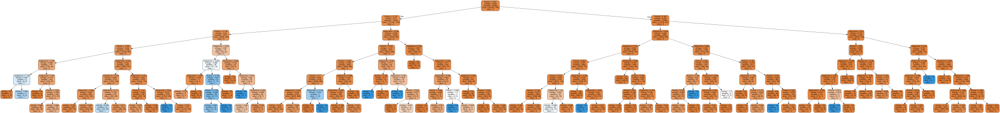

In [24]:
from sklearn.tree import export_graphviz
import graphviz

treePic = export_graphviz(DTreeClass, out_file = None, filled = True, rounded = True,special_characters = True, feature_names = col_names ,class_names = ['0','1'])

graph = graphviz.Source(treePic)
graph.render("decision_tree", view = True)
graph

In [25]:
treePic = export_graphviz(DTreeClass, out_file = 'DTreeClass.dot', filled = True, rounded = True,special_characters = True, feature_names = col_names ,class_names = ['1','0'])

!dot -Tpng DTreeClass.dot -o DTreeClass.png -Gdpi=600

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.490619 to fit


In [26]:
from IPython.display import Image
Image(filename = 'DTreeClass.png', width = 800, height = 300)

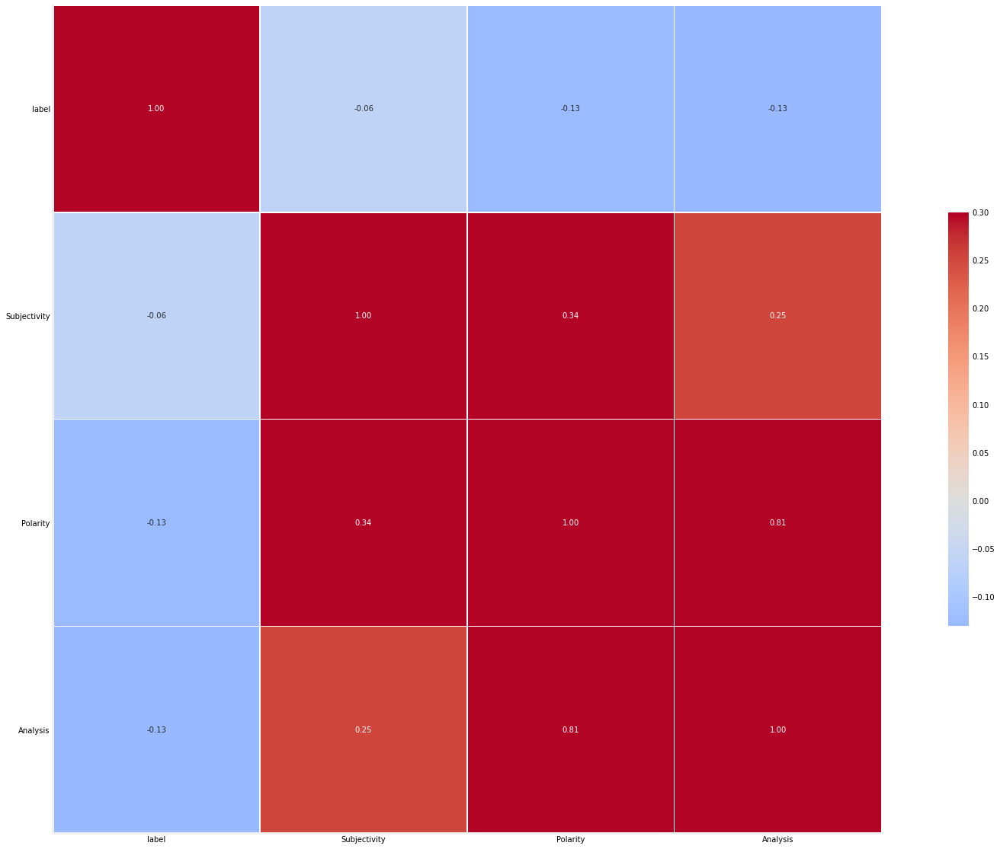

In [27]:
import seaborn as sns
import matplotlib.pyplot as plt

%matplotlib inline

corr = train_ds.corr()
graph1 = sns.heatmap(corr,  vmax=.3, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5}, annot=True, fmt='.2f', cmap='coolwarm')
sns.despine()
graph1.figure.set_size_inches(28,20)
    
plt.show()

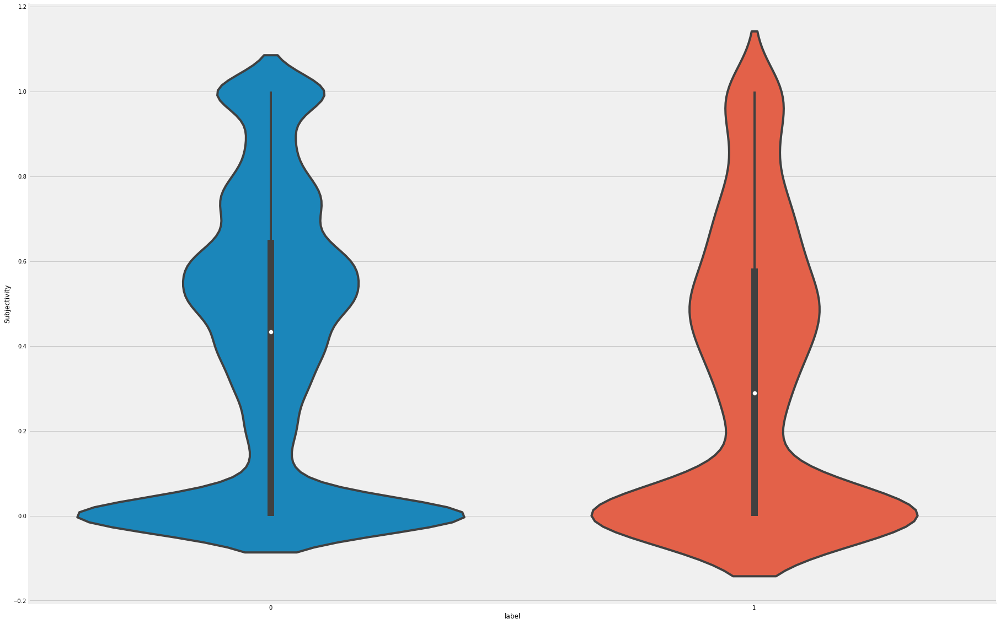

In [28]:
graph2 = sns.violinplot(y = "Subjectivity",x = "label", data = train_ds, size = 28)
sns.despine()
graph2.figure.set_size_inches(28,20)
plt.show()

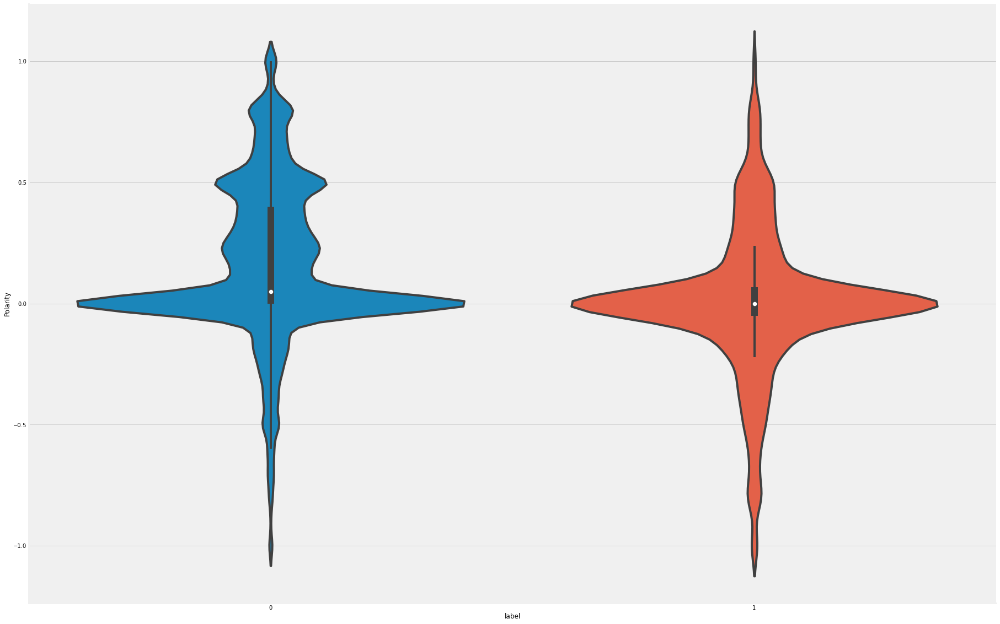

In [29]:
graph3 = sns.violinplot(y = "Polarity",x = "label", data = train_ds, size = 28)
sns.despine()
graph3.figure.set_size_inches(28,20)
plt.show()

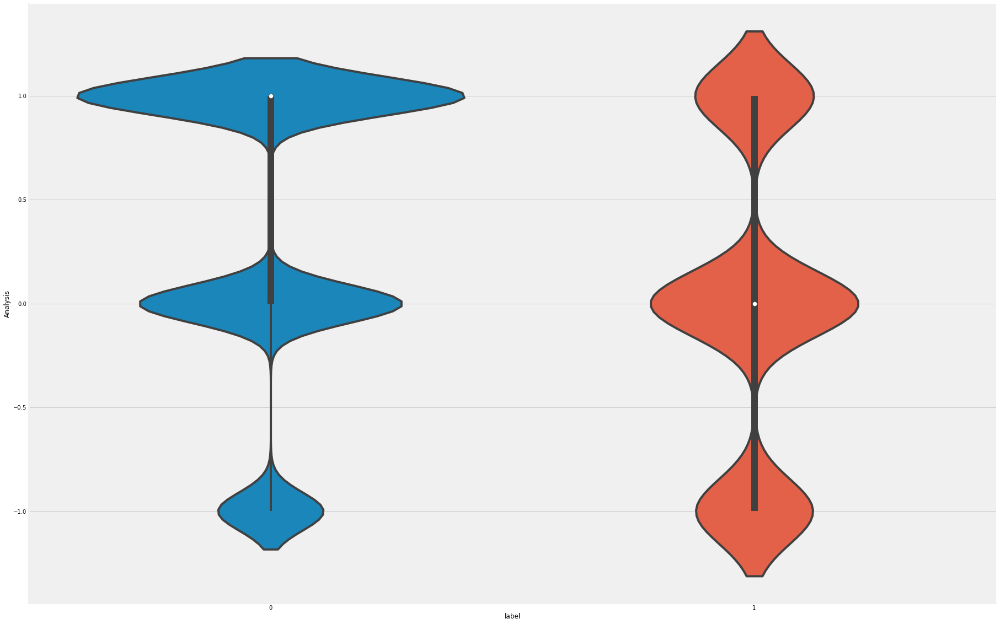

In [30]:
graph4 = sns.violinplot(y = "Analysis",x = "label", data = train_ds, size = 28)
sns.despine()
graph4.figure.set_size_inches(28,20)
plt.show()

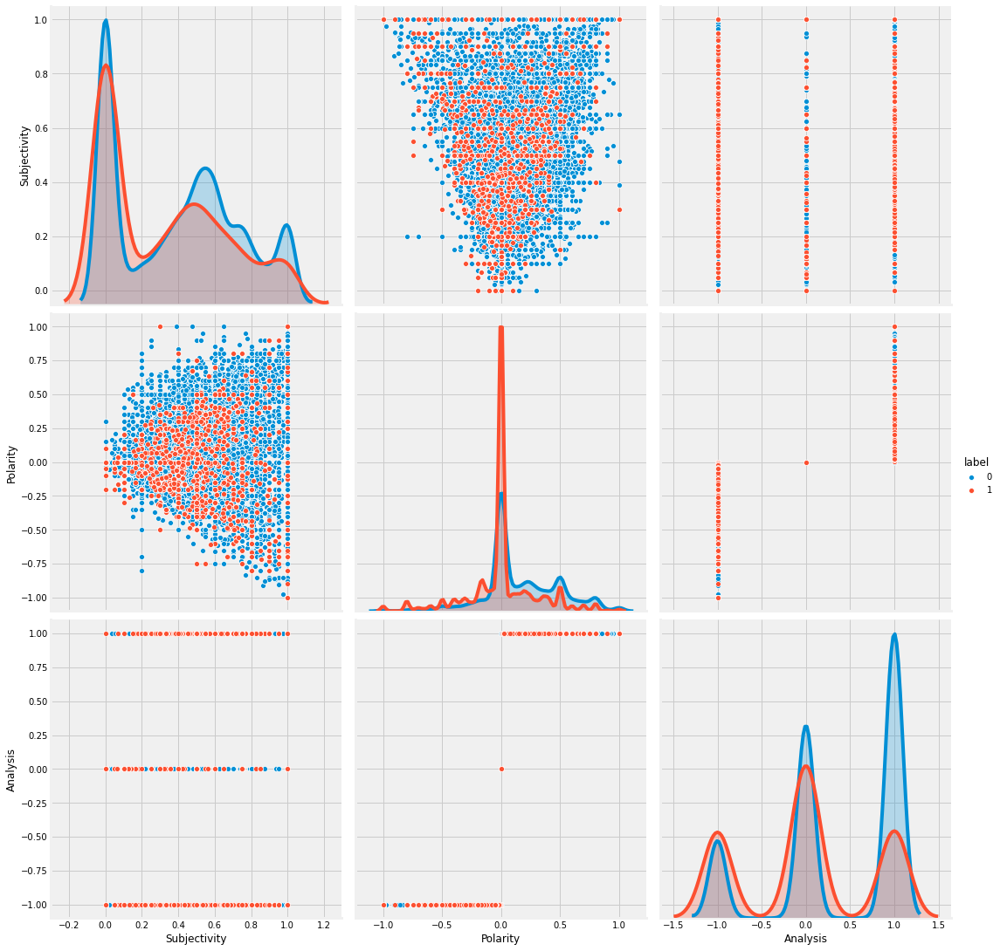

In [31]:
graph5 = sns.pairplot(train_ds, hue = "label", height = 5.0)